In [196]:
%reset

In [197]:
#import necessory libraries
import torch
import torchvision
import numpy as np
import matplotlib.pyplot as plt
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torchvision.utils import make_grid
from torch.utils.data.dataloader import DataLoader
from torch.utils.data import random_split
import os
%matplotlib inline

In [198]:
data_dir = '../Datasets/asl_alphabet_train/'
test_data_dir = '../Datasets/asl_alphabet_test/'

In [199]:
dataset = ImageFolder(data_dir, transform=transforms.Compose([
    transforms.Resize((150,150)),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomVerticalFlip(0.3),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
]))
test_dataset = ImageFolder(test_data_dir, transform=transforms.Compose([
    transforms.Resize((150,150)),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomVerticalFlip(0.3),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
]))

In [200]:
img, label = dataset[0]
print(img.shape, label)

torch.Size([3, 150, 150]) 0


In [201]:
print(f"Images in tarining data : {len(dataset)}")
print(f"Images in test data : {len(test_dataset)}")

Images in tarining data : 84000
Images in test data : 28


In [202]:
print("Follwing classes are there : \n",dataset.classes)
print("Number of classes: ", len(dataset.classes))

Follwing classes are there : 
 ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z', 'nothing', 'space']
Number of classes:  28


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Label : A


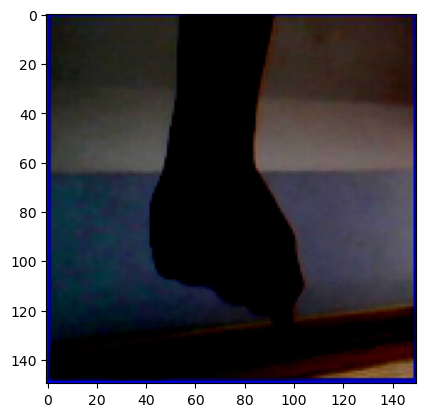

In [203]:
# visualising some images
def display_img(img, label):
    print(f'Label : {dataset.classes[label]}')
    plt.imshow(img.permute(1,2,0))

display_img(*dataset[0])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Label : B


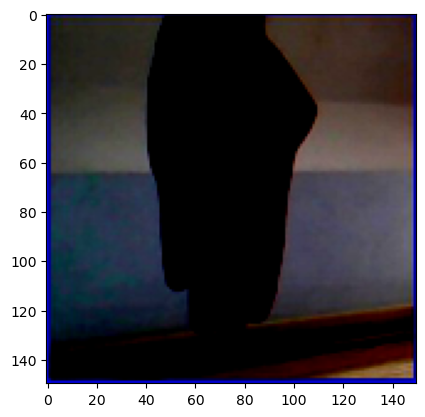

In [204]:
display_img(*dataset[5000])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Label : nothing


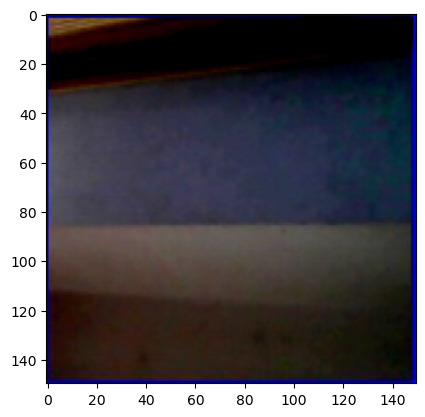

In [205]:
display_img(*dataset[80000])

In [206]:
random_seed = 2021
torch.manual_seed(random_seed)

In [207]:
def load_dataset(data_path):
    # split dataset into 70% training and 30% test
    train_size = int(0.7 * len(dataset))
    val_size = len(dataset) - train_size

    # random training/test split
    train_dataset, val_dataset = random_split(dataset, [train_size, val_size])
    print(f"Length of Train Data : {len(train_dataset)}")
    print(f"Length of Validation Data : {len(val_dataset)}")

    # define loader for training data
    train_loader = DataLoader(
        train_dataset,
        batch_size=32,
        num_workers=0,
        shuffle=False
    )

    # define loader for testing data
    val_loader = DataLoader(
        val_dataset,
        batch_size=32,
        num_workers=0,
        shuffle=False
    )
    
    return train_loader, val_loader

train_loader, test_loader = load_dataset(data_dir)
batch_size = train_loader.batch_size
print('Data loaders ready to read', data_dir)

Length of Train Data : 58799
Length of Validation Data : 25201
Data loaders ready to read ../Datasets/asl_alphabet_train/


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


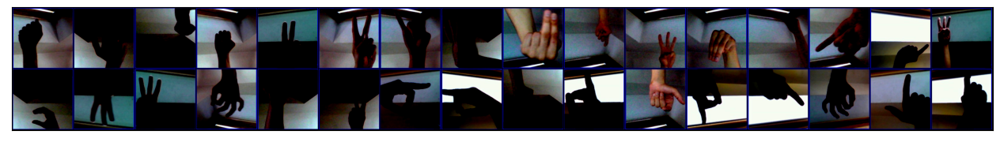

In [208]:
# display grid of train data images
from torchvision.utils import make_grid

def show_batch(dl):
    for images, labels in dl:
        fig,ax = plt.subplots(figsize = (16,12))
        ax.set_xticks([])
        ax.set_yticks([])
        ax.imshow(make_grid(images,nrow=16).permute(1,2,0))
        break

show_batch(train_loader)

In [209]:
class ImageClassificationBase(nn.Module):
    
    def training_step(self, batch):
        images, labels = batch 
        out = self(images)                  # Generate predictions
        loss = F.cross_entropy(out, labels) # Calculate loss
        return loss
    
    def validation_step(self, batch):
        images, labels = batch 
        out = self(images)                    # Generate predictions
        loss = F.cross_entropy(out, labels)   # Calculate loss
        acc = accuracy(out, labels)           # Calculate accuracy
        return {'val_loss': loss.detach(), 'val_acc': acc}
        
    def validation_epoch_end(self, outputs):
        batch_losses = [x['val_loss'] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()   # Combine losses
        batch_accs = [x['val_acc'] for x in outputs]
        epoch_acc = torch.stack(batch_accs).mean()      # Combine accuracies
        return {'val_loss': epoch_loss.item(), 'val_acc': epoch_acc.item()}
    
    def epoch_end(self, epoch, result):
        print("Epoch [{}], train_loss: {:.4f}, val_loss: {:.4f}, val_acc: {:.4f}".format(
            epoch, result['train_loss'], result['val_loss'], result['val_acc']))
        
def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))

In [210]:
class SignLanguageClassification(ImageClassificationBase):
    
    def __init__(self):
        
        super().__init__()
        self.network = nn.Sequential(
            
            nn.Conv2d(3, 32, kernel_size = 3, padding = 1),
            nn.ReLU(),
            nn.Conv2d(32,64, kernel_size = 3, stride = 1, padding = 1),
            nn.ReLU(),
            nn.MaxPool2d(2,2),
        
            nn.Conv2d(64, 128, kernel_size = 3, stride = 1, padding = 1),
            nn.ReLU(),
            nn.Conv2d(128 ,128, kernel_size = 3, stride = 1, padding = 1),
            nn.ReLU(),
            nn.MaxPool2d(2,2),
            
            nn.Conv2d(128, 256, kernel_size = 3, stride = 1, padding = 1),
            nn.ReLU(),
            nn.Conv2d(256,256, kernel_size = 3, stride = 1, padding = 1),
            nn.ReLU(),
            nn.MaxPool2d(2,2),
            
            nn.Flatten(),
            nn.Linear(82944,1024),
            nn.ReLU(),
            nn.Linear(1024, 512),
            nn.ReLU(),
            nn.Linear(512,28)
        )
    
    def forward(self, xb):
        return self.network(xb)

In [211]:
model = SignLanguageClassification()
model

SignLanguageClassification(
  (network): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU()
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU()
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU()
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU()
    (14): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (15): Flatten(start_dim=1, end_dim=-1)
    (16): Linear(in_features=82944, out_features=1024, bias=True)
    (17): ReLU()
    (18): Li

In [212]:
for images, labels in train_loader:
    print('images.shape:', images.shape)
    out = model(images)
    print('out.shape:', out.shape)
    print('out[0]:', out[0])
    break

images.shape: torch.Size([32, 3, 150, 150])
out.shape: torch.Size([32, 28])
out[0]: tensor([-0.0376, -0.0285,  0.0365, -0.0220, -0.0350,  0.0166, -0.0009,  0.0229,
         0.0206,  0.0108, -0.0132,  0.0319, -0.0090,  0.0361, -0.0278, -0.0343,
         0.0466, -0.0229,  0.0032,  0.0139, -0.0378,  0.0404,  0.0051,  0.0350,
        -0.0058,  0.0307, -0.0261,  0.0004], grad_fn=<SelectBackward0>)


In [213]:
# helper function or classes to load data into GPU
def get_default_device():
    """ Set Device to GPU or CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    

def to_device(data, device):
    "Move data to the device"
    if isinstance(data,(list,tuple)):
        return [to_device(x,device) for x in data]
    return data.to(device,non_blocking = True)

class DeviceDataLoader():
    """ Wrap a dataloader to move data to a device """
    
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
    
    def __iter__(self):
        """ Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b,self.device)
            
    def __len__(self):
        """ Number of batches """
        return len(self.dl)

In [214]:
device = torch.device('mps')
device

device(type='mps')

In [215]:
# load the into GPU
train_dl = DeviceDataLoader(train_loader, device)
val_dl = DeviceDataLoader(test_loader, device)
to_device(model, device)

SignLanguageClassification(
  (network): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU()
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU()
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU()
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU()
    (14): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (15): Flatten(start_dim=1, end_dim=-1)
    (16): Linear(in_features=82944, out_features=1024, bias=True)
    (17): ReLU()
    (18): Li

In [216]:
# model fitting
@torch.no_grad()
def evaluate(model, val_loader):
    model.eval()
    outputs = [model.validation_step(batch) for batch in val_loader]
    return model.validation_epoch_end(outputs)

def fit(epochs, lr, model, train_loader, val_loader, opt_func = torch.optim.SGD):
    
    history = []
    optimizer = opt_func(model.parameters(),lr)
    for epoch in range(epochs):
        
        model.train()
        train_losses = []
        print('Start of Epoch: {}'.format(epoch))
        for batch in train_loader:
            print('Start of Batch: {}'.format(batch))
            loss = model.training_step(batch)
            train_losses.append(loss)
            print('Train losses added for Batch {}'.format(batch))
            loss.backward()
            print('Loss Backward calculated for Batch {}, Epoch {}'.format(batch, epoch))
            optimizer.step()
            print('Optimizer step for Batch {}, Epoch {}'.format(batch, epoch))
            optimizer.zero_grad()
            print('Optimizer zero grad for Batch {}, Epoch {}'.format(batch, epoch))
            
        result = evaluate(model, val_loader)
        result['train_loss'] = torch.stack(train_losses).mean().item()
        model.epoch_end(epoch, result)
        print('End of Epoch: {}'.format(epoch))
        history.append(result)
    
    return history

In [170]:
# load model to device
model = to_device(SignLanguageClassification(), device)

# initial evaluation of model
evaluate(model, val_dl)

{'val_loss': inf, 'val_acc': 0.03671804815530777}

In [217]:
num_epochs = 2
opt_func = torch.optim.Adam
lr = 0.001

history = fit(num_epochs,lr,model,train_dl,val_dl,opt_func)

Start of Epoch: 0
Start of Batch: [tensor([[[[-0.9922, -0.9686, -0.9608,  ..., -0.9373, -0.9529, -0.9922],
          [-0.8353, -0.5216, -0.5216,  ..., -0.4745, -0.6863, -0.9765],
          [-0.6471, -0.0902, -0.0275,  ..., -0.0196, -0.4667, -0.9608],
          ...,
          [-0.5373,  0.4118,  0.4431,  ...,  0.6471, -0.1765, -0.9765],
          [-0.5765,  0.3333,  0.3647,  ...,  0.6235, -0.1765, -0.9765],
          [-0.8824, -0.5922, -0.5608,  ..., -0.4980, -0.7490, -0.9922]],

         [[-0.9686, -0.9843, -0.9843,  ..., -0.9922, -0.9843, -0.9765],
          [-0.8745, -0.6235, -0.6392,  ..., -0.5294, -0.7725, -0.9843],
          [-0.7569, -0.2314, -0.2000,  ..., -0.0902, -0.5451, -0.9843],
          ...,
          [-0.5765,  0.3255,  0.3647,  ...,  0.7725, -0.0980, -0.9686],
          [-0.5765,  0.3098,  0.3490,  ...,  0.7412, -0.1216, -0.9765],
          [-0.8353, -0.5843, -0.5529,  ..., -0.4353, -0.7098, -0.9765]],

         [[ 0.9373,  0.8510,  0.8196,  ...,  0.8196,  0.8980,  0.94

KeyboardInterrupt: 

In [ ]:
def plot_accuracies(history):
    """ Plot the history of accuracies"""
    accuracies = [x['val_acc'] for x in history]
    plt.plot(accuracies, '-x')
    plt.xlabel('epoch')
    plt.ylabel('accuracy')
    plt.title('Accuracy vs. No. of epochs');
    

plot_accuracies(history)

In [ ]:
def plot_losses(history):
    """ Plot the losses in each epoch"""
    train_losses = [x.get('train_loss') for x in history]
    val_losses = [x['val_loss'] for x in history]
    plt.plot(train_losses, '-bx')
    plt.plot(val_losses, '-rx')
    plt.xlabel('epoch')
    plt.ylabel('loss')
    plt.legend(['Training', 'Validation'])
    plt.title('Loss vs. No. of epochs');

plot_losses(history)

In [ ]:
# Apply the model on test dataset and Get the results
test_loader = DeviceDataLoader(DataLoader(test_dataset, batch_size*2), device)
result = evaluate(model, test_loader)
result

In [ ]:
#save the model
torch.save(model.state_dict(), 'sign-language-classification.pth')